In [1]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal as signal
from scipy.io.wavfile import read, write
from IPython.display import Audio
from sympy import symbols
import math
np.seterr(divide='ignore', invalid='ignore')

{'divide': 'warn', 'over': 'warn', 'under': 'ignore', 'invalid': 'warn'}

## Audio Load

In [2]:
#Audio
file_audio=('../audios/audio1.wav')
fs,x=read(file_audio)
X=x/float(max(abs(x)))
x=x-np.mean(x)
t=np.arange(0,float(len(x))/fs,1/fs)
#Audio(x,rate=fs)

<ipython-input-2-13ddb037c13c>:3: WavFileWarning: Chunk (non-data) not understood, skipping it.
  fs,x=read(file_audio)


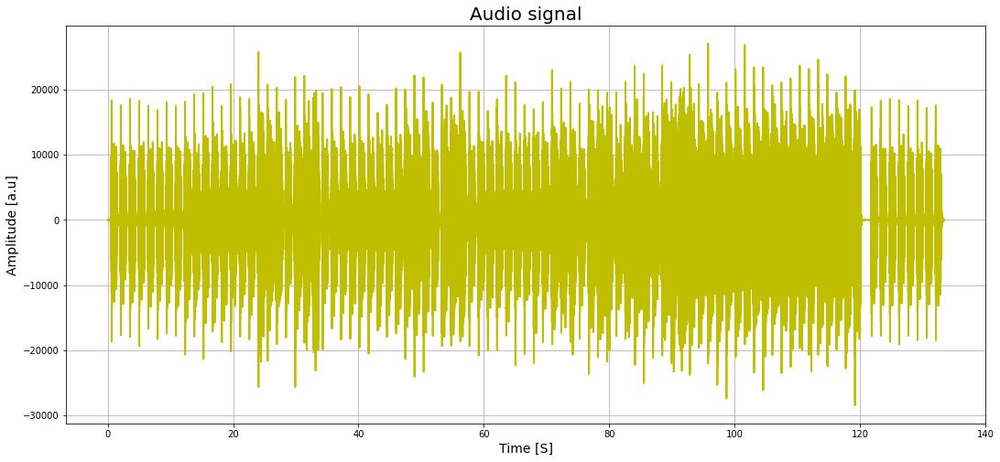

In [3]:
plt.figure(figsize=(18,8))
plt.plot(t,x,linewidth=2,color="y")
plt.xlabel("Time [S]",fontsize=14)
plt.ylabel("Amplitude [a.u]",fontsize=14)
plt.title("Audio signal",fontsize=20)
plt.grid()
plt.show()

## FIR Parameters

In [4]:
N=111

fc1=150
fc2=10000
BW=300

ftype="Lowpass"

#fs=18000

## Determine the Filter Type

In [5]:
if (ftype=="Lowpass"):
    bands=[0,fc1,fc1+BW,fs/2]
    desired=[1,0]
elif(ftype=="Highpass"):
    bands=[0,fc1-BW,fc1,fs/2]
    desired=[0,1]
elif(ftype=="Bandpass"):
    bands=[0,fc1-BW,fc1,fc2,fc2+BW,fs/2]
    desired=[0,1,0] 
elif(ftype=="Bandstop"):
    bands=[0,fc1-BW,fc1,fc2,fc2+BW,fs/2]
    desired=[1,0,1]

## Get the Components of the Remez Filter

In [6]:
h=signal.remez(N,bands,desired,fs=fs)

In [7]:
W,H= signal.freqz(h,1,1024)

## Filter Output

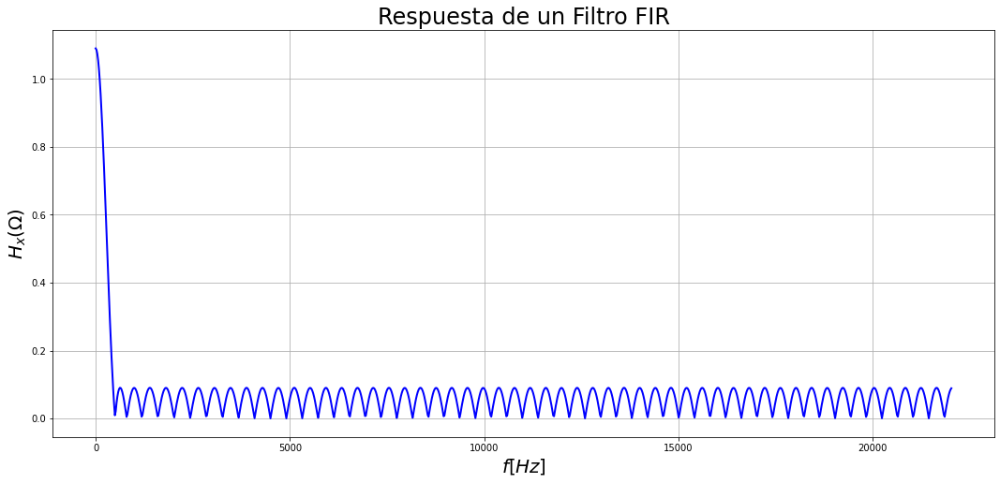

In [8]:
plt.figure(figsize=(18,8))
plt.plot(W/np.pi*(fs/2),np.abs(H),linewidth=2,color="b")
plt.xlabel("$f [Hz]$",fontsize=20)
plt.ylabel("$H_x (\Omega)$",fontsize=20)
plt.title("Respuesta de un Filtro FIR",fontsize=24)
plt.grid()
plt.show()

In [9]:
y=signal.lfilter(h,1,x)              # x is the audio
Audio(y,rate=fs)

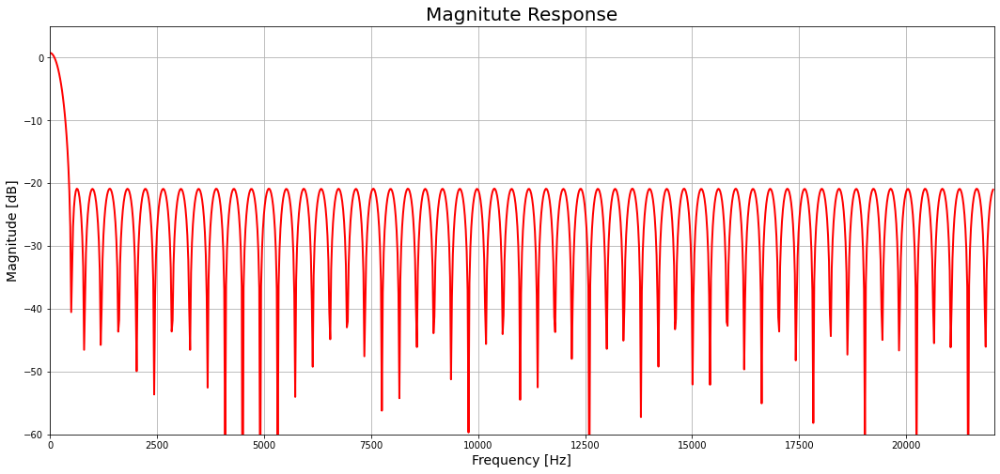

In [10]:
Mag = 20*np.log10(abs(H))  
Freq = W*fs/(2*np.pi) 

plt.figure(figsize=(18, 8)) 
plt.plot(Freq, Mag, 'r', linewidth=2) 
plt.xlabel('Frequency [Hz]', fontsize=14) 
plt.ylabel('Magnitude [dB]', fontsize=14)
plt.title('Magnitute Response', fontsize=20)
plt.xlim(0,fs/2)
plt.ylim(-60,5)
plt.grid()
plt.show()